# Examine RadarSAT2 Archive for a particular location

# (GOOD!) Now that MDA is part of Maxar, it seems new and better search finally exists!
https://gsiportal.mdacorporation.com/gc_cp/#/map 

###### (BAD) full catalog search as of 10/2018:
https://www.eodms-sgdot.nrcan-rncan.gc.ca/index_en.jsp 


###### (BAD) old catalog search allows downloading csvs:
https://neodf.nrcan.gc.ca/neodf_cat3/index.php?lang=en#



In [5]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.dates import YearLocator, MonthLocator, DateFormatter
from pandas.plotting import table
import matplotlib.dates as mdates

In [6]:
%matplotlib inline
#%qtconsole

In [7]:
pwd

'/Users/scott/Documents/GitHub/snowex/snowex2019'

In [8]:
ls /Users/scott/Documents/Research/Stereo2SWE/RS2/

AMR-rs2-archive.kml
JMR-rs2-archive.kml
LCC-rs2-archive.kml
SAG-rs2-archive.kml
SJL-rs2-archive.kml
boise-rs2-search.geojson
boise-rs2-search.kml
conus-wa-ascending-rs2-archive.kml
conus-wa-descending-2017-rs2-archive.kml
conus-wa-descending-2018-rs2-archive.kml
conus-wa-rs2-archive.geojson
conus-wa-rs2-archive.kml
gm-aoi.kml
gm-rs2-search.geojson
gm-rs2-search.kml
gm-search.table
grandmesa-aoi.geojson
reynolds-rs2-search.geojson
reynolds-rs2-search.kml
washington-conus.geojson
washington-conus.kml


In [9]:
vectorFile = '/Users/scott/Documents/Research/Stereo2SWE/RS2/washington-conus.geojson'

# Pacific Northwest

In [10]:
# Doesn't work so well.
#import fiona
#fiona.drvsupport.supported_drivers['kml'] = 'rw' 
#fiona.drvsupport.supported_drivers['LIBKML'] = 'rw' 
#gf = gpd.read_file('/Users/scott/Documents/Research/Stereo2SWE/RS2/gm-rs2-search.kml')
#gf.head()

In [17]:
gf = gpd.read_file('/Users/scott/Documents/Research/Stereo2SWE/RS2/conus-wa-rs2-archive.geojson')
gf.head()

,Name,description,timestamp,begin,end,altitudeMode,tessellate,extrude,visibility,drawOrder,icon,layer,path,geometry
0,2018-11-17T02:11:51,\nGeoCenter Feature ID: d14d0a8a-2324-4fee-a3d...,None,None,None,None,-1,0,-1,None,None,conus-wa-ascending-rs2-archive Features,/Users/scott/Documents/Research/Stereo2SWE/RS2...,(POLYGON Z ((-122.7615568164999 47.64109630985...
1,2018-11-14T01:59:21,\nGeoCenter Feature ID: 2197d524-3ad5-4430-819...,None,None,None,None,-1,0,-1,None,None,conus-wa-ascending-rs2-archive Features,/Users/scott/Documents/Research/Stereo2SWE/RS2...,(POLYGON Z ((-122.7993073044929 47.63047522946...
2,2018-11-07T02:03:31,\nGeoCenter Feature ID: 1ad09bf6-ee27-4358-97d...,None,None,None,None,-1,0,-1,None,None,conus-wa-ascending-rs2-archive Features,/Users/scott/Documents/Research/Stereo2SWE/RS2...,(POLYGON Z ((-122.7229214870535 47.64250370056...
3,2018-11-07T02:03:11,\nGeoCenter Feature ID: 667853d7-e4a4-439c-aac...,None,None,None,None,-1,0,-1,None,None,conus-wa-ascending-rs2-archive Features,/Users/scott/Documents/Research/Stereo2SWE/RS2...,(POLYGON Z ((-122.617209797054 46.441377577288...
4,2018-10-31T02:07:42,\nGeoCenter Feature ID: aa662682-918d-4aad-aec...,None,None,None,None,-1,0,-1,None,None,conus-wa-ascending-rs2-archive Features,/Users/scott/Documents/Research/Stereo2SWE/RS2...,(POLYGON Z ((-122.8406571828282 47.63165086015...


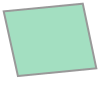

In [18]:
gf.Name.iloc[0]
gf.geometry.iloc[0]

In [19]:
# function to split description into columns

#test = gf.description.iloc[0]
kml2dict = {}
for i,entry in gf.iterrows():
    lines = entry.description.strip('\n').split('\n')
    attr = {}
    attr['Name'] = entry.Name
    attr['geometry'] = entry.geometry
    for line in lines:
        #print(line)
        k,v = line.split(': ')
        attr[k] = v

    
    kml2dict[i] = attr

In [20]:
gf = gpd.GeoDataFrame(kml2dict)
gf = gf.transpose()
gf['Path'] = gf['Relative Orbit Number'].astype(float).apply(int)
gf['Date'] = gf.Name.str[:10]
gf.head()

,Absolute Orbit Number,Acquisition End Time,Acquisition Start Time,Beam Mode,Beam Position,GeoCenter Feature ID,Image ID,Incidence Angle,Name,Polarization,Relative Orbit Number,Scene Number,Spacecraft Orientation,Swath Direction,geometry,Path,Date
0,57031.12882,2018-11-17T02:11:58.987Z,2018-11-17T02:11:51.082Z,Wide Ultrafine,U25W2,d14d0a8a-2324-4fee-a3d1-cf2f3cf596d7,681041,47.860416,2018-11-17T02:11:51,HH,200.12882,1,RIGHT,Ascending,(POLYGON Z ((-122.7615568164999 47.64109630985...,200,2018-11-17
1,56988.12981,2018-11-14T01:59:29.229Z,2018-11-14T01:59:21.320Z,Wide Ultrafine,U8W2,2197d524-3ad5-4430-819e-4925afab47c5,680338,36.219601,2018-11-14T01:59:21,HH,157.12981,1,RIGHT,Ascending,(POLYGON Z ((-122.7993073044929 47.63047522946...,157,2018-11-14
2,56888.12945,2018-11-07T02:03:39.877Z,2018-11-07T02:03:31.973Z,Wide Ultrafine,U14W2,1ad09bf6-ee27-4358-97d4-118f307250f6,678728,40.698086,2018-11-07T02:03:31,HH,57.12945,1,RIGHT,Ascending,(POLYGON Z ((-122.7229214870535 47.64250370056...,57,2018-11-07
3,56888.12613,2018-11-07T02:03:19.805Z,2018-11-07T02:03:11.901Z,Wide Ultrafine,U13W2,667853d7-e4a4-439c-aacb-975206e1db9c,678727,39.919895,2018-11-07T02:03:11,HH,57.12613,1,RIGHT,Ascending,(POLYGON Z ((-122.617209797054 46.441377577288...,57,2018-11-07
4,56788.12913,2018-10-31T02:07:50.382Z,2018-10-31T02:07:42.480Z,Wide Ultrafine,U19W2,aa662682-918d-4aad-aeca-f417a136be4e,677104,44.124901,2018-10-31T02:07:42,HH,300.12913,1,RIGHT,Ascending,(POLYGON Z ((-122.8406571828282 47.63165086015...,300,2018-10-31


In [21]:
print('Total acquisitions:', len(gf))
print('Beam Mode:', gf['Beam Mode'].unique())
print('Beam Position:', gf['Beam Position'].unique())
print('Polarizations:', gf['Polarization'].unique())
print('Relative Orbits', gf['Path'].unique())
#print('Relative Orbits', gf['Relative Orbit Number'].unique())

Total acquisitions: 834
Beam Mode: ['Wide Ultrafine' 'Extra Fine' 'Ultrafine' 'Wide Fine' 'Wide'
 'Wide Fine Quad Polarization' 'Wide Multi-Look Fine' 'Fine' 'Standard'
 'Fine Quad Polarization' 'Multi-Look Fine' 'Standard Quad Polarization']
Beam Position: ['U25W2' 'U8W2' 'U14W2' 'U13W2' 'U19W2' 'U2W2' 'XF0W3' 'U71' 'F0W2' 'W2'
 'FQ11W' 'FQ15W' 'FQ5W' 'FQ10W' 'MF1W' 'FQ1W' 'F2' 'F0W1' 'U79' 'U74'
 'U1W2' 'U23W2' 'MF3W' 'S8' 'FQ2' 'MF6' 'FQ21' 'W1' 'U20' 'FQ7W' 'FQ2W'
 'FQ12W' 'FQ21W' 'FQ17W' 'F0W3' 'U10W2' 'F22F' 'F3F' 'S2' 'F6F' 'F1F' 'W3'
 'S6' 'F4' 'F4N' 'F2F' 'SQ14' 'MF4N' 'S3' 'MF2N' 'F4F' 'F3N' 'MF22F' 'S7'
 'U6W2' 'U12W2' 'U27W2' 'S4']
Polarizations: ['HH' 'HH+HV' 'VV+VH' 'HH+VV+HV+VH']
Relative Orbits [200 157  57 300 257 114  14 164  64 207 307 107  21 264]


In [22]:
gf.keys()

Index(['Absolute Orbit Number', 'Acquisition End Time',
       'Acquisition Start Time', 'Beam Mode', 'Beam Position',
       'GeoCenter Feature ID', 'Image ID', 'Incidence Angle', 'Name',
       'Polarization', 'Relative Orbit Number', 'Scene Number',
       'Spacecraft Orientation', 'Swath Direction', 'geometry', 'Path',
       'Date'],
      dtype='object')

In [23]:
# Simple groupby beam mode counts
# Need to also sort by relative orbit number!
mode =  'Extra Fine'
#cols =  ['date','Scene Number', 'Swath Direction']
cols =  ['Date','Scene Number', 'Swath Direction', 'Path']
sort = ['Swath Direction','Path','Scene Number']
#gf[('Beam Mode' == 'Extra Fine')]
gf.loc[gf['Beam Mode'] == 'Extra Fine', cols].groupby(sort).count()

Date
Swath Direction Path Scene Number      
Ascending       57   1               30
                     2               23
                     3                5
                157  1                1
                     3               13
                257  1                9
                300  1                4
                     2               15
Descending      64   1                8
                     2                1
                164  1               29
                     2                5
                307  1                1

In [24]:
# Extract particular path
#save = gf.loc[gf['Path'] == 128]
#save
#gf.keys()

In [25]:
# Rename to dinosar conventions
gf.rename(columns={"Date" : 'sceneDate', 
                "Path" : 'relativeOrbit', 
                "Swath Direction" : 'flightDirection',
                "Image ID" : 'sceneId',
                "Beam Mode" : 'opMode',
                "Beam Position" : 'beamNo',
                "Scene Number" : 'frame',
                "Incidence Anggle" : 'incidence',
                "Polarization" : 'polarization'}, 
         inplace=True)
#gf.to_file('query-alos2-dinosar.geojson', driver='GeoJSON')

In [26]:
# Plot these frames on a map
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from cartopy.io.img_tiles import GoogleTiles

In [27]:
def plot_map(gf, snwe, vectorFile=None, zoom=8, title='Orbital Footprints', tableFrame=None):
    pad = 1
    S, N, W, E = snwe
    plot_CRS = ccrs.PlateCarree()
    geodetic_CRS = ccrs.Geodetic()
    x0, y0 = plot_CRS.transform_point(W-pad, S-pad, geodetic_CRS)
    x1, y1 = plot_CRS.transform_point(E+pad, N+pad, geodetic_CRS)

    fig, ax = plt.subplots(figsize=(5, 5), dpi=150,
                           subplot_kw=dict(projection=plot_CRS))

    ax.set_xlim((x0, x1))
    ax.set_ylim((y0, y1))
    url = 'http://tile.stamen.com/terrain/{z}/{x}/{y}.png'
    tiler = GoogleTiles(url=url)
    # NOTE: going higher than zoom=8 is slow...
    ax.add_image(tiler, zoom)

    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='110m',
        facecolor='none')
    ax.add_feature(states_provinces, edgecolor='k', linestyle=':')
    ax.coastlines(resolution='10m', color='black', linewidth=2)
    ax.add_feature(cfeature.BORDERS)
    
    if type(tableFrame) == gpd.geodataframe.GeoDataFrame:
        table(ax, tableFrame, loc='top', zorder=10, fontsize=10,
          cellLoc='center', rowLoc='center',
          bbox=[0.1, 0.7, 0.6, 0.3]) 

    # Add region of interest polygon in specified
    if vectorFile:
        tmp = gpd.read_file(vectorFile)
        ax.add_geometries(tmp.geometry.values,
                          ccrs.PlateCarree(),
                          facecolor='none',
                          edgecolor='m',
                          lw=2,
                          linestyle='dashed')

    orbits = gf.relativeOrbit.unique()
    colors = plt.cm.jet(np.linspace(0, 1, orbits.size))

    for orbit, color in zip(orbits, colors):
        df = gf.query('relativeOrbit == @orbit')
        poly = df.geometry.cascaded_union

        if df.flightDirection.iloc[0] == 'ASCENDING':
            linestyle = '--'
            xpos, ypos = poly.centroid.x, poly.bounds[3]
        else:
            linestyle = '-'
            xpos, ypos = poly.centroid.x, poly.bounds[1]

        ax.add_geometries([poly],
                          ccrs.PlateCarree(),
                          facecolor='none',
                          edgecolor=color,
                          lw=2,
                          linestyle=linestyle)
        ax.text(xpos, ypos, orbit, color=color, fontsize=16, fontweight='bold',
                transform=geodetic_CRS)

    gl = ax.gridlines(plot_CRS, draw_labels=True,
                      linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    gl.xlabels_top = False
    gl.ylabels_left = False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER

    plt.title(title)
    plt.savefig('map.pdf', bbox_inches='tight')

In [28]:
def plot_timeline(gf, title='Acquisition Timeline'):
    """Plot dinosar inventory acquisitions as a timeline.

    Parameters
    ----------
    gf :  GeoDataFrame
        A geopandas GeoDataFrame

    """

    # Same colors as map
    orbits = gf.relativeOrbit.unique()
    colors = plt.cm.jet(np.linspace(0, 1, orbits.size))

    fig, ax = plt.subplots(figsize=(11, 8.5))
    plt.scatter(gf.timeStamp.values, gf.orbitCode.values,
                edgecolors=colors[gf.orbitCode.values], facecolors='None',
                cmap='jet', s=60, label='ALOS-2')

    plt.yticks(gf.orbitCode.unique(), gf.relativeOrbit.unique())

    ax.xaxis.set_minor_locator(mdates.MonthLocator())
    ax.xaxis.set_major_locator(mdates.YearLocator())
    plt.legend(loc='lower right')
    plt.ylim(-1, orbits.size)
    plt.ylabel('Orbit Number')
    fig.autofmt_xdate()
    plt.title(title)
    plt.savefig('timeline.pdf', bbox_inches='tight')

In [29]:
def print_dates(GF):
    ''' print list of dates from dataframe'''
    tmp = GF.loc[:, ['sceneId','sceneDate']].reset_index(drop=True)
    tmp.loc[:, 'timeStamp'] = pd.to_datetime(tmp.sceneDate)
    tmp['date'] = tmp.sceneDate.str[:10]
    timeDeltas = tmp.timeStamp.diff()
    tmp['dt'] = timeDeltas.dt.days
    tmp.loc[0, 'dt'] = 0
    tmp['dt'] = tmp.dt.astype('i2')
    return tmp.loc[:, ['date','dt']]

In [31]:
# Generate plots for all possible interferometric pairs (with dinosar naming scheme)
#gf = gf.query('opMode == "Extra Fine"')
# Consider only scenes with >10 viable for interferometry

order = ["flightDirection", "opMode", "relativeOrbit", "frame", "beamNo"]
GF = gf.groupby(order).filter(lambda x: len(x["sceneId"]) > 10)
# Reprint summary as groupby object

w, s, e, n = GF.geometry.cascaded_union.bounds
snwe = [s, n, w, e]

GF.groupby(order)["sceneId"].count()

flightDirection  opMode                relativeOrbit  frame  beamNo
Ascending        Extra Fine            57             1      XF0W3     30
                                                      2      XF0W3     23
                                       157            3      XF0W3     13
                                       300            2      XF0W3     15
                 Fine                  57             1      F2        60
                 Wide Ultrafine        57             1      U13W2     15
                                       157            1      U8W2      13
Descending       Extra Fine            164            1      XF0W3     29
                 Fine                  21             1      F6F       35
                                                      2      F6F       35
                                                      3      F6F       35
                                       64             1      F2        33
                                            

In [34]:
GB = GF.groupby(order)["sceneId"]
print(GB.groups)

{('Ascending', 'Extra Fine', 57, '1', 'XF0W3'): Int64Index([ 10,  25,  42,  53,  63,  94, 114, 116, 120, 122, 132, 141, 143,
            147, 149, 153, 155, 162, 171, 173, 178, 180, 185, 187, 196, 198,
            202, 204, 208, 210],
           dtype='int64'), ('Ascending', 'Extra Fine', 57, '2', 'XF0W3'): Int64Index([ 34,  79,  86,  92,  98, 101, 107, 110, 113, 115, 119, 121, 131,
            142, 148, 154, 161, 172, 179, 186, 197, 203, 209],
           dtype='int64'), ('Ascending', 'Extra Fine', 157, '3', 'XF0W3'): Int64Index([15, 22, 30, 39, 62, 68, 77, 83, 89, 90, 96, 99, 105], dtype='int64'), ('Ascending', 'Extra Fine', 300, '2', 'XF0W3'): Int64Index([112, 117, 124, 126, 140, 144, 150, 156, 158, 163, 168, 174, 181,
            188, 192],
           dtype='int64'), ('Ascending', 'Fine', 57, '1', 'F2'): Int64Index([146, 152, 160, 170, 177, 184, 191, 195, 207, 212, 213, 214, 216,
            217, 218, 219, 220, 221, 224, 226, 228, 230, 232, 233, 236, 237,
            239, 242, 245, 

In [35]:
#inventory = GF.loc[indices]
#inventory.sceneDate.dtype

/Users/scott/miniconda3/envs/py37/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


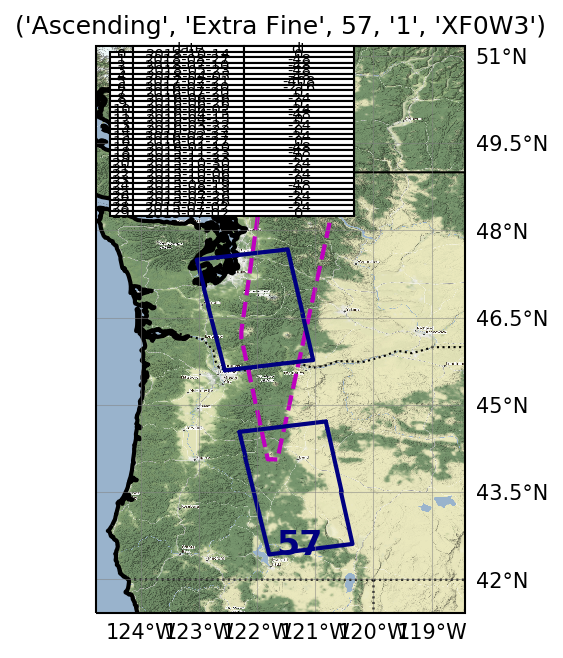

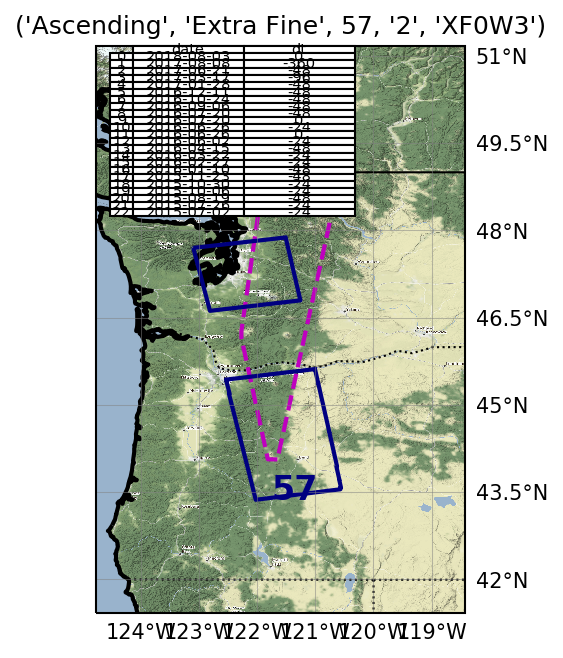

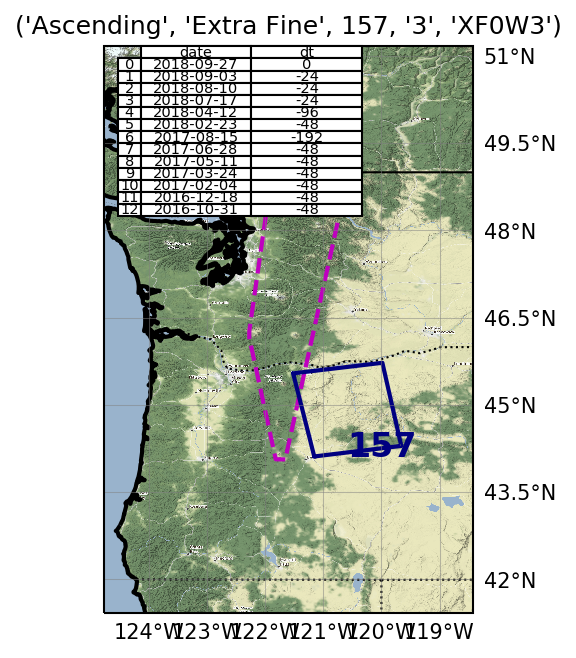

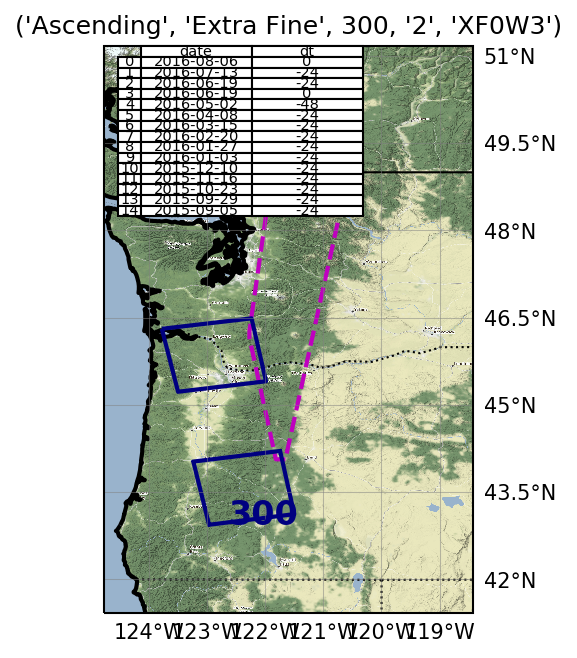

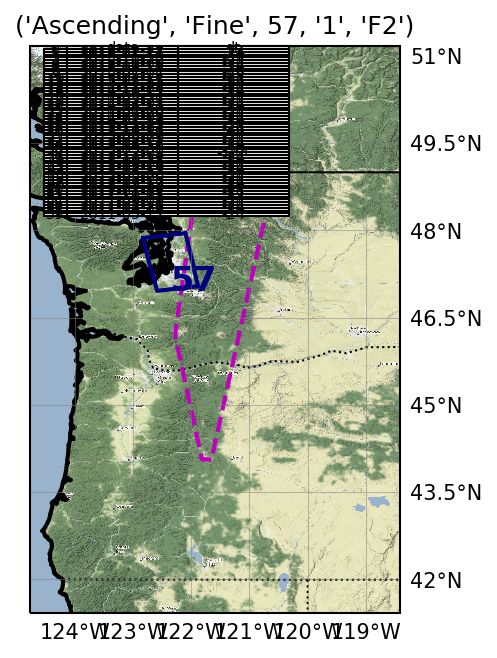

...

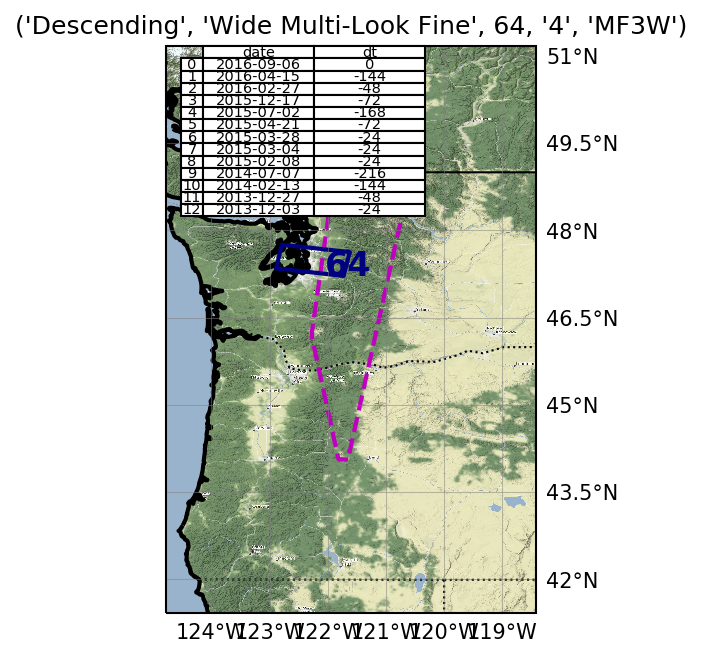

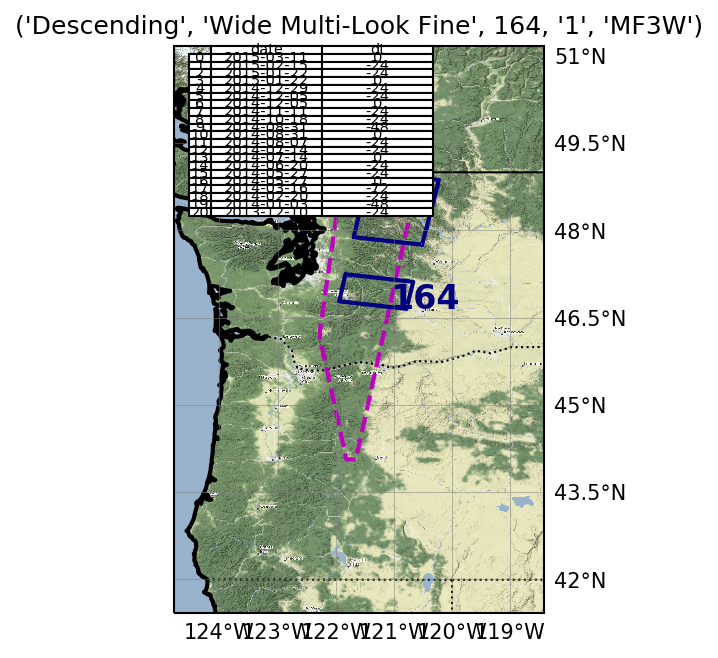

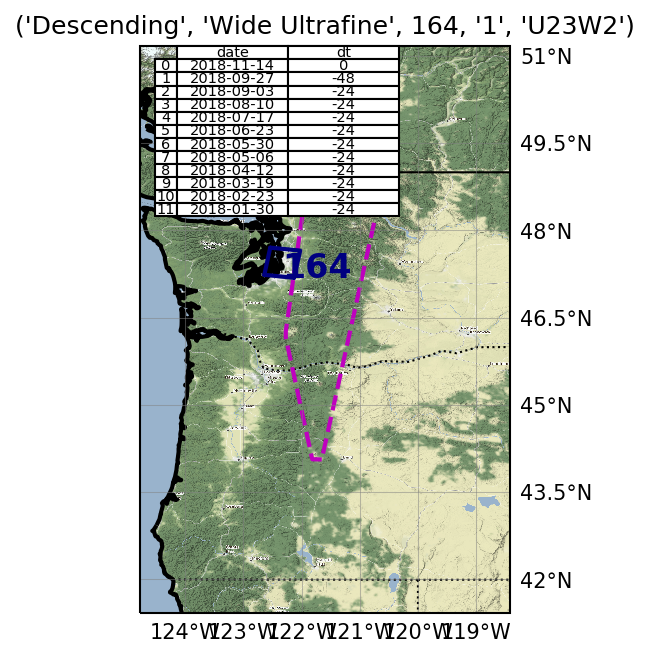

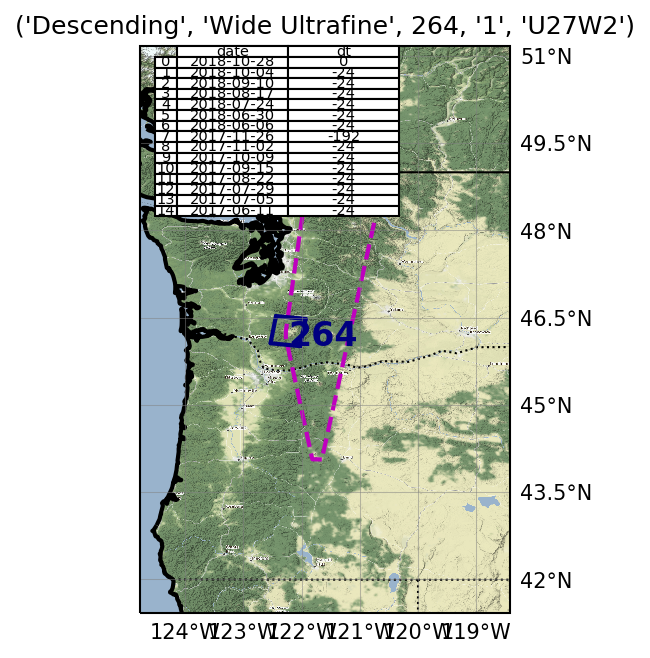

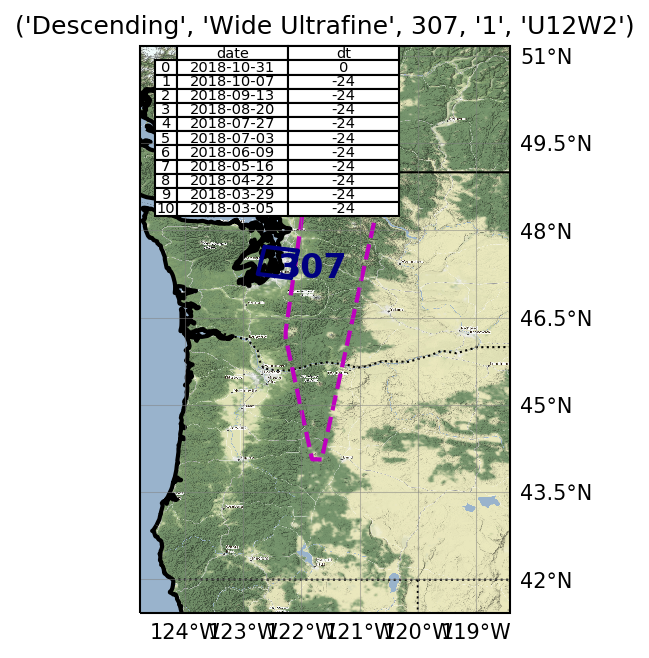

In [36]:
# Print maps for all combinations of possible interferometric pairs!
for labels, indices in GB.groups.items():
    #print(labels, indices)
    #print(labels, DF.loc[indices, "Scene ID"].tolist())
    inventory = GF.loc[indices]
    tmp = print_dates(inventory)
    plot_map(inventory, snwe, vectorFile, title=str(labels), tableFrame=tmp)

In [37]:
def print_inventory(GF):
    ''' print list of dates from dataframe'''
    tmp = GF.loc[:, ['sceneId','sceneDate']].reset_index(drop=True)
    tmp.loc[:, 'timeStamp'] = pd.to_datetime(tmp.sceneDate)
    tmp['date'] = tmp.sceneDate.str[:10]
    timeDeltas = tmp.timeStamp.diff()
    tmp['dt'] = timeDeltas.dt.days
    tmp.loc[0, 'dt'] = 0
    tmp['dt'] = tmp.dt.astype('i2')
    return tmp.loc[:, ['sceneId','date','dt']]

In [38]:
print_inventory(inventory)

,sceneId,date,dt
0,677201,2018-10-31,0
1,671565,2018-10-07,-24
2,665827,2018-09-13,-24
3,659991,2018-08-20,-24
4,654489,2018-07-27,-24
5,648899,2018-07-03,-24
6,643216,2018-06-09,-24
7,637654,2018-05-16,-24
8,632246,2018-04-22,-24
9,626842,2018-03-29,-24


In [39]:
# Forecast inventory based on 24 day increments
# Forecast upcoming acquisistion dates!
start = pd.to_datetime(inventory.sceneDate.iloc[0])
R = np.arange(5)
[start+x*pd.Timedelta(24,'D') for x in R]

[Timestamp('2018-10-31 00:00:00'),
 Timestamp('2018-11-24 00:00:00'),
 Timestamp('2018-12-18 00:00:00'),
 Timestamp('2019-01-11 00:00:00'),
 Timestamp('2019-02-04 00:00:00')]